In [103]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


***Importing the basic necessary python libraries and modules***

In [104]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display
pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [105]:
# Reading the dataset

project_path = '/content/drive/My Drive/Assignment/'
file_name ='input_data.xlsx'

In [106]:
df=pd.read_excel(project_path+file_name)

#Displaying the top 10 records of the dataframe

df.head(10)

,Short description,Description,Caller,Assignment group
0,login issue,-verified user details.(employee# & manager na...,spxjnwir pjlcoqds,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,hmjdrvpb komuaywn,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,eylqgodm ybqkwiam,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,xbkucsvz gcpydteq,GRP_0
4,skype error,skype error,owlgqjme qhcozdfx,GRP_0
5,unable to log in to engineering tool and skype,unable to log in to engineering tool and skype,eflahbxn ltdgrvkz,GRP_0
6,event: critical:HostName_221.company.com the v...,event: critical:HostName_221.company.com the v...,jyoqwxhz clhxsoqy,GRP_1
7,ticket_no1550391- employment status - new non-...,ticket_no1550391- employment status - new non-...,eqzibjhw ymebpoih,GRP_0
8,unable to disable add ins on outlook,unable to disable add ins on outlook,mdbegvct dbvichlg,GRP_0
9,ticket update on inplant_874773,ticket update on inplant_874773,fumkcsji sarmtlhy,GRP_0


In [107]:
#Displaying the data type of each attribute

df.dtypes

Short description    object
Description          object
Caller               object
Assignment group     object
dtype: object

In [108]:
#Displaying the shape of the dataframe

df.shape

(8500, 4)

*This shows that there are 8500 rows and 4 attributes in the dataframe.*

In [109]:
# Displaying the information regarding the attributes

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8500 entries, 0 to 8499
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   Short description  8492 non-null   object
 1   Description        8499 non-null   object
 2   Caller             8500 non-null   object
 3   Assignment group   8500 non-null   object
dtypes: object(4)
memory usage: 265.8+ KB


*Since Caller column mainly contains the details of the user who raised the incident and is of not much use in our analysis and can be dropped. Assignment group is our predictor / target column with multiple classes. So, this is a Multiclass Classification problem..*



In [110]:
# Dropping the caller column

df1 = df.drop('Caller',axis=1)

# Displaying the top 5 records of the dataframe after dropping the Caller column

df1.head()

,Short description,Description,Assignment group
0,login issue,-verified user details.(employee# & manager na...,GRP_0
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0
4,skype error,skype error,GRP_0


In [111]:
#Checking the null/missing values in the dataframe

df1.isnull().sum()

Short description    8
Description          1
Assignment group     0
dtype: int64

In [112]:
!pip install missingno

In [113]:
import missingno as msno

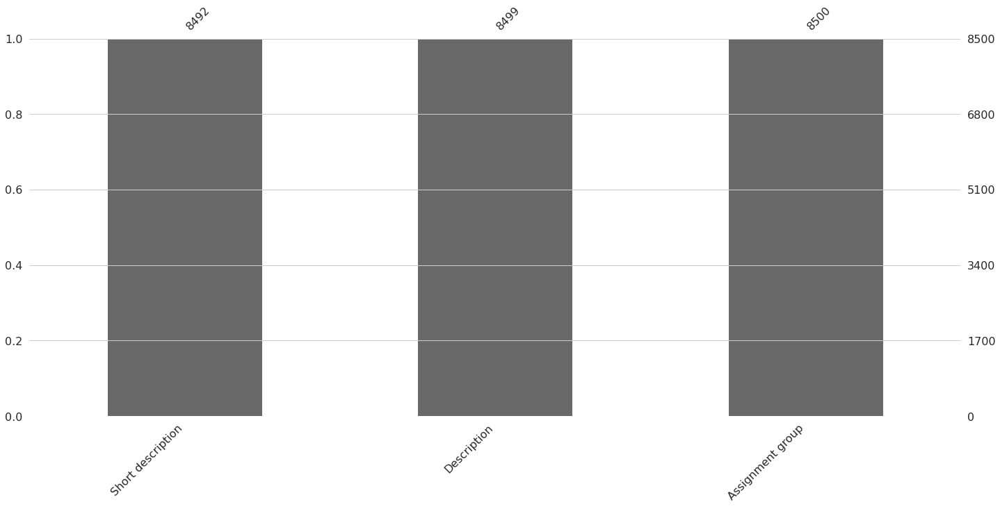

In [114]:
# Visualizing the number of missing values as a bar chart  

msno.bar(df1)

*Thus we can observe from here that their are total 8 NaN values in short description and 1 NaN value in Description attribute*

In [115]:
#Displaying the records with NaN value in Short Description and Description column

df1[df1.isnull().any(axis=1)]

,Short description,Description,Assignment group
2604,NaN,\r\n\r\nreceived from: ohdrnswl.rezuibdt@gmail...,GRP_34
3383,NaN,\r\n-connected to the user system using teamvi...,GRP_0
3906,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3910,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3915,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3921,NaN,-user unable tologin to vpn.\r\n-connected to...,GRP_0
3924,NaN,name:wvqgbdhm fwchqjor\nlanguage:\nbrowser:mic...,GRP_0
4341,NaN,\r\n\r\nreceived from: eqmuniov.ehxkcbgj@gmail...,GRP_0
4395,i am locked out of skype,NaN,GRP_0


In [116]:
# Filling the NaN value in Short Description and Description column by space(" ")

df1['Short description'].fillna(value=" ",inplace=True)
df1['Description'].fillna(value = " ",inplace=True)

In [117]:
#Again Checking the null/missing values in the dataframe

df1.isnull().sum()

Short description    0
Description          0
Assignment group     0
dtype: int64

In [130]:
#Concatenate Short Description and Description columns in a new column "New Description"

df1['New Description'] = df1['Short description'] + ' ' +df1['Description']

#Displaying the first 5 records of the new concatenated dataframe

df1.head()

,Short description,Description,Assignment group,New Description
0,login issue,-verified user details.(employee# & manager na...,GRP_0,login issue -verified user details.(employee# ...
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0,outlook \r\n\r\nreceived from: hmjdrvpb.komuay...
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0,cant log in to vpn \r\n\r\nreceived from: eylq...
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0,unable to access hr_tool page unable to access...
4,skype error,skype error,GRP_0,skype error skype error


In [136]:
# Displaying the Duplicate recors in the dataframe

df_copy = df1[['Short description', 'Description','Assignment group','New Description']].copy()
duplicateRowsDF = df_copy[df_copy.duplicated()]
duplicateRowsDF



,Short description,Description,Assignment group,New Description
51,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,GRP_0,call for ecwtrjnq jpecxuty call for ecwtrjnq j...
81,erp SID_34 account locked,erp SID_34 account locked,GRP_0,erp SID_34 account locked erp SID_34 account l...
123,unable to display expense report,unable to display expense report,GRP_0,unable to display expense report unable to dis...
157,ess password reset,ess password reset,GRP_0,ess password reset ess password reset
229,call for ecwtrjnq jpecxuty,call for ecwtrjnq jpecxuty,GRP_0,call for ecwtrjnq jpecxuty call for ecwtrjnq j...
235,erp SID_34 account unlock and password reset,erp SID_34 account unlock and password reset,GRP_0,erp SID_34 account unlock and password reset e...
242,windows password reset,windows password reset,GRP_0,windows password reset windows password reset
274,windows account locked,windows account locked,GRP_0,windows account locked windows account locked
301,windows password reset,windows password reset,GRP_0,windows password reset windows password reset
312,erp SID_34 account unlock,erp SID_34 account unlock,GRP_0,erp SID_34 account unlock erp SID_34 account u...


In [137]:
print("Total Number of duplicate records are:",duplicateRowsDF['Description'].count() )

Total Number of duplicate records are: 591


In [138]:
# Removing Duplicate records 

df_updt =df1.drop_duplicates(['Short description', 'Description', 'Assignment group','New Description'])

#Displaying the shape of the dataframe after removing the duplicate records

df_updt.shape

(7909, 4)

In [139]:
# Checking number of unique groups in the dataframe

df_updt['Assignment group'].unique()

array(['GRP_0', 'GRP_1', 'GRP_3', 'GRP_4', 'GRP_5', 'GRP_6', 'GRP_7',
       'GRP_8', 'GRP_9', 'GRP_10', 'GRP_11', 'GRP_12', 'GRP_13', 'GRP_14',
       'GRP_15', 'GRP_16', 'GRP_17', 'GRP_18', 'GRP_19', 'GRP_2',
       'GRP_20', 'GRP_21', 'GRP_22', 'GRP_23', 'GRP_24', 'GRP_25',
       'GRP_26', 'GRP_27', 'GRP_28', 'GRP_29', 'GRP_30', 'GRP_31',
       'GRP_33', 'GRP_34', 'GRP_35', 'GRP_36', 'GRP_37', 'GRP_38',
       'GRP_39', 'GRP_40', 'GRP_41', 'GRP_42', 'GRP_43', 'GRP_44',
       'GRP_45', 'GRP_46', 'GRP_47', 'GRP_48', 'GRP_49', 'GRP_50',
       'GRP_51', 'GRP_52', 'GRP_53', 'GRP_54', 'GRP_55', 'GRP_56',
       'GRP_57', 'GRP_58', 'GRP_59', 'GRP_60', 'GRP_61', 'GRP_32',
       'GRP_62', 'GRP_63', 'GRP_64', 'GRP_65', 'GRP_66', 'GRP_67',
       'GRP_68', 'GRP_69', 'GRP_70', 'GRP_71', 'GRP_72', 'GRP_73'],
      dtype=object)

In [140]:
#Displaying the basic description of Assignment group column

df_updt["Assignment group"].describe()

count      7909
unique       74
top       GRP_0
freq       3429
Name: Assignment group, dtype: object


*From this we can observe that their are total 74 unique target groups in our dataframe*

In [152]:
# Displaying the total number of tickets falling under each Assignment group with their respective percentage 

df2 = df_updt['Assignment group'].value_counts().reset_index()
df2['Percentage'] = (df2['Assignment group']/df2['Assignment group'].sum())*100
df2.head(10)

,index,Assignment group,Percentage
0,GRP_0,3429,43.355671
1,GRP_8,645,8.155266
2,GRP_24,285,3.603490
3,GRP_12,256,3.236819
4,GRP_9,252,3.186244
5,GRP_2,241,3.047161
6,GRP_19,214,2.705778
7,GRP_3,200,2.528765
8,GRP_6,183,2.313820
9,GRP_13,145,1.833354


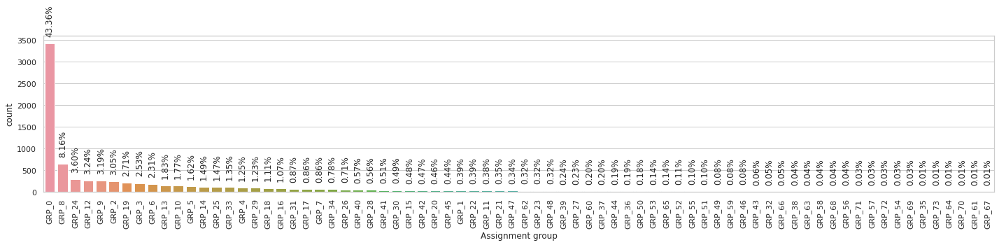

In [142]:
#Displaying the total number of tickets falling under each Assignment group with their respective percentage 

import seaborn as sns
import warnings

sns.set(style="whitegrid")
plt.figure(figsize=(20,5))
ax = sns.countplot(x="Assignment group", data=df_updt, order=df_updt["Assignment group"].value_counts().index)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
for p in ax.patches:
 ax.annotate(str(format(p.get_height()/len(df_updt.index)*100, '.2f')+"%"), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'bottom', rotation=90, xytext = (0, 10), textcoords = 'offset points')

plt.tight_layout()
plt.show()

*From this we can observe that Assignment group attribute is highly right skewed . Also, more than 40% of the data i.e, around 3429 records falls under Group 1 , thus implying that the dataframe is exteremly imbalance.*

In [143]:
# Displaying the top 20 Assignment groups with highest number of tickets falling under them in ascending order 

df_top_20 = df_updt['Assignment group'].value_counts().nlargest(20).reset_index()
df_top_20

,index,Assignment group
0,GRP_0,3429
1,GRP_8,645
2,GRP_24,285
3,GRP_12,256
4,GRP_9,252
5,GRP_2,241
6,GRP_19,214
7,GRP_3,200
8,GRP_6,183
9,GRP_13,145


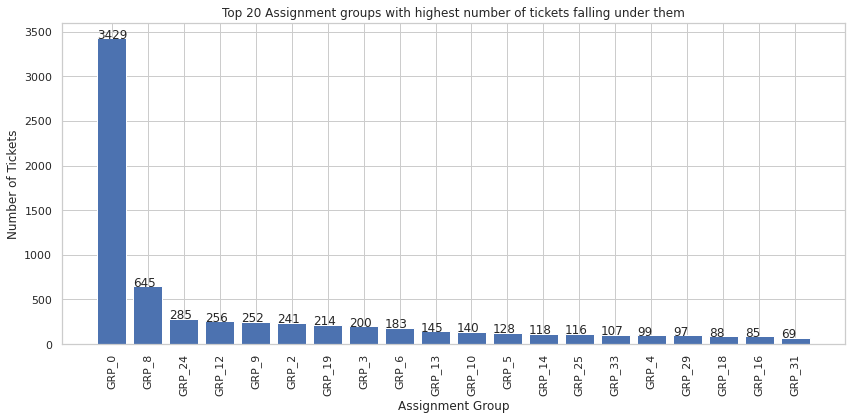

In [153]:
# Visualizing the top 20 assignment groups 

plt.figure(figsize=(12,6))
bars = plt.bar(df_top_20['index'],df_top_20['Assignment group'])
plt.title('Top 20 Assignment groups with highest number of tickets falling under them')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


In [145]:
# Displaying the bottom 20 Assignment groups with minimum number of tickets falling under them in descending order 

df_bottom_20 = df_updt['Assignment group'].value_counts().nsmallest(20).reset_index()
df_bottom_20

,index,Assignment group
0,GRP_35,1
1,GRP_73,1
2,GRP_64,1
3,GRP_70,1
4,GRP_61,1
5,GRP_67,1
6,GRP_71,2
7,GRP_57,2
8,GRP_72,2
9,GRP_54,2


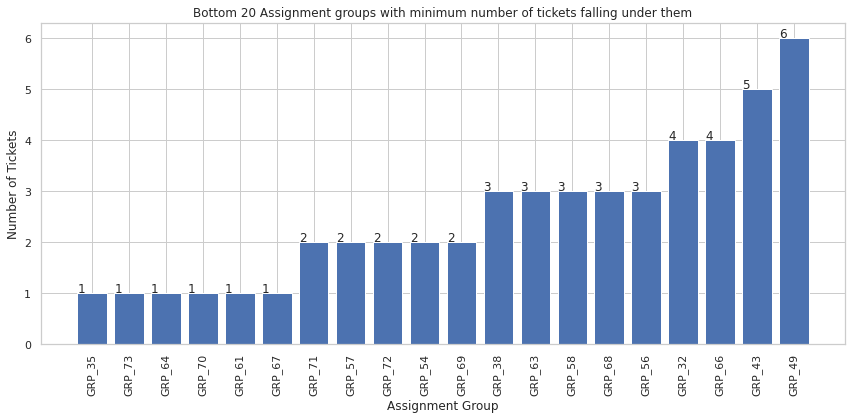

In [154]:
# Visualizing the bottom 20 assignment groups  

plt.figure(figsize=(12,6))
bars = plt.bar(df_bottom_20['index'],df_bottom_20['Assignment group'])
plt.title('Bottom 20 Assignment groups with minimum number of tickets falling under them')
plt.xlabel('Assignment Group')
plt.xticks(rotation=90)
plt.ylabel('Number of Tickets')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .005, yval)
plt.tight_layout()
plt.show()


In [147]:
# Displaying a record before cleaning the garbled data

df_updt["New Description"][186]

'é\x9d’å²›å…´å\x90ˆæœºç”µshipment notificationé‚®ç®±è®¾ç½® from:  \nsent: friday, october 28, 2016 7:20 am\nto: nwfodmhc exurcwkm\nsubject: re: é\x9d’å²›å…´å\x90ˆæœºç”µshipment notificationé‚®ç®±è®¾ç½®\n\ndearï¼Œ\npls help to update customer 4563729890 shipment notification email address :  abcdegy@gmail.com \n\n\nb. '

In [149]:
# Displaying another record before cleaning the garbled data 

df_updt["New Description"][281] 

'unable to down load ethics module  from: brdhdd dhwduw\nsent: thursday, october 27, 2016 6:12 am\nto: nwfodmhc exurcwkm\nsubject::fwd: unable to down load ethics module \n\n\nbegin forwarded message:\nfrom:  <dqwhpjxy.pozjxbey@gmail.com>\nto:  <zanivrec.capbfhur@gmail.com>\nsubject: unable to down load ethics module \nhi  â€“ trust doing well . i am unable to down load & getting below msg. i did reset resolution however still same issue persist.\n \nplease help.\n \n \n \n \n \ndirector of sales \ncompany indirect channels  - asia \n& \ndqwhpjxy.pozjxbey@gmail.com \n\n \n \n \n \n\n\n'

In [150]:
! pip install ftfy

In [151]:
from ftfy import *

In [161]:
val = df_updt.loc[: ,'New Description']

In [163]:
val.head()

0    login issue -verified user details.(employee# ...
1    outlook \n\nreceived from: hmjdrvpb.komuaywn@g...
2    cant log in to vpn \n\nreceived from: eylqgodm...
3    unable to access hr_tool page unable to access...
4                            skype error  skype error 
Name: New Description, dtype: object

In [165]:
df_updt['New Description'] = val.apply(fix_text)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [167]:
#After using fify.fix_text on the given dataframe
df_updt["New Description"][186]

'青岛兴合机电shipment notification邮箱设置 from:  \nsent: friday, october 28, 2016 7:20 am\nto: nwfodmhc exurcwkm\nsubject: re: 青岛兴合机电shipment notification邮箱设置\n\ndear,\npls help to update customer 4563729890 shipment notification email address :  abcdegy@gmail.com \n\n\nb. '

In [168]:
df_updt["New Description"][281]

'unable to down load ethics module  from: brdhdd dhwduw\nsent: thursday, october 27, 2016 6:12 am\nto: nwfodmhc exurcwkm\nsubject::fwd: unable to down load ethics module \n\n\nbegin forwarded message:\nfrom:  <dqwhpjxy.pozjxbey@gmail.com>\nto:  <zanivrec.capbfhur@gmail.com>\nsubject: unable to down load ethics module \nhi  – trust doing well . i am unable to down load & getting below msg. i did reset resolution however still same issue persist.\n \nplease help.\n \n \n \n \n \ndirector of sales \ncompany indirect channels  - asia \n& \ndqwhpjxy.pozjxbey@gmail.com \n\n \n \n \n \n\n\n'

In [170]:
# Defining various function for cleaning the data 

import re  
#Remove numbers(integers)

def removeNumbers(text):
    text = ''.join([i for i in text if not i.isdigit()])         
    return text

#Replace Contractions

contraction_patterns = [ (r'won\'t', 'will not'),(r'didn\'t', 'did not'),(r'didnt', 'did not'), (r'can\'t', 'cannot'),(r'cant', 'cannot'), (r'i\'m', 'i am'), (r'ain\'t', 'is not'), (r'(\w+)\'ll', '\g<1> will'), (r'(\w+)n\'t', '\g<1> not'),
                         (r'(\w+)\'ve', '\g<1> have'), (r'(\w+)\'s', '\g<1> is'), (r'(\w+)\'re', '\g<1> are'), (r'(\w+)\'d', '\g<1> would'), (r'&', 'and'), (r'dammit', 'damn it'), (r'dont', 'do not'), (r'wont', 'will not') ]

def replaceContraction(text):
    patterns = [(re.compile(regex), repl) for (regex, repl) in contraction_patterns]
    for (pattern, repl) in patterns:
        (text, count) = re.subn(pattern, repl, text)
    return text


#Remove mail related words
       
def clean_data(text):
    text = re.sub(r"received from:",' ',text)
    text = re.sub(r"from:",' ',text)
    text = re.sub(r"to:",' ',text)
    text = re.sub(r"subject:",' ',text)
    text = re.sub(r"sent:",' ',text)
    text = re.sub(r"ic:",' ',text)
    text = re.sub(r"cc:",' ',text)
    text = re.sub(r"bcc:",' ',text)
    text = re.sub(r"hi",' ',text)
    text = re.sub(r"hello",' ',text)
    text = re.sub(r"com",' ',text)
    text = re.sub(r"gmail",' ',text)
    #Remove email 
    text = re.sub(r'\S*@\S*\s?', '', text)
    # Remove new line characters 
    text = re.sub(r'\n',' ',text)
    # Remove hashtag while keeping hashtag text
    text = re.sub(r'#','', text)
    #& 
    text = re.sub(r'&;?', 'and',text)
    # Remove HTML special entities (e.g. &amp;)
    text = re.sub(r'\&\w*;', '', text)
    # Remove hyperlinks
    text = re.sub(r'https?:\/\/.*\/\w*', '', text)  
    # Remove characters beyond Readable formart by Unicode:
    text= ''.join(c for c in text if c <= '\uFFFF') 
    text = text.strip()
    # Remove unreadable characters  (also extra spaces)
    text = ' '.join(re.sub("[^\u0030-\u0039\u0041-\u005a\u0061-\u007a]", " ", text).split())
    
    return text
  


In [171]:
def cleandata(text):
    # remove numbers
    text = removeNumbers(text)
    
    #remove punctuations
    text = re.sub(r"\W", " ", text, flags=re.I)
    text = text.replace('_',' ')
    
    #replace contractions
    text = replaceContraction(text)
      
    #convert to lower case
    text = text.lower()
    
    #remove mail related words
    text = clean_data(text)
            
    return text

In [173]:
# Applying the cleandata function to clean the dataframe

df_updt["New Description"] = val.apply(cleandata)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [174]:
#Displaying a record after the cleaning the data

df_updt["New Description"][281]

'unable to down load et cs module from brdhdd dhwduw sent thursday october am to nwfodmhc exurcwkm subject fwd unable to down load et cs module begin forwarded message from dqwhpjxy pozjxbey to zanivrec capbfhur subject unable to down load et cs module trust doing well i am unable to down load getting below msg i did reset resolution however still same issue persist please help director of sales pany indirect channels asia dqwhpjxy pozjxbey'

In [175]:
! pip install langdetect

In [177]:
# Defining  a function for the detection of the various languages in the dataframe

from langdetect import detect
    
def fn_lan_detect(df):                                        
   try:                                                          
      return detect(df)                                      
   except:                                                       
      return 'no'                                                  

df_updt['Language'] = val.apply(fn_lan_detect)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [178]:
# Displaying the languages present in the dataframe with their respective number of record in the dataframe

df_updt["Language"].value_counts()

en    6679
de     365
af     183
it     105
no     105
fr      90
nl      73
sv      63
ca      43
pl      34
es      30
da      30
pt      17
cy      14
tl      13
sl      11
ro      11
sq       9
et       8
fi       5
hr       5
cs       3
lv       3
id       3
sk       2
so       2
lt       2
hu       1
Name: Language, dtype: int64

/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


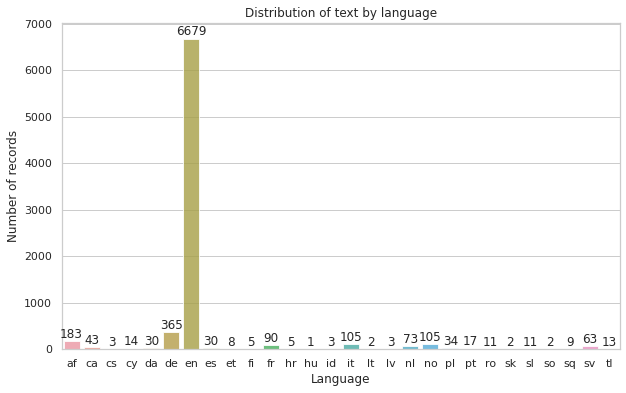

In [180]:
# Visualizing  the languages present in the dataframe with their respective number of record in the dataframe

x = df_updt["Language"].value_counts()
x=x.sort_index()
plt.figure(figsize=(10,6))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Distribution of text by language")
plt.ylabel('Number of records')
plt.xlabel('Language')
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

In [184]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [182]:
from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet, stopwords
stop = set(stopwords.words('english')) 
lemmatizer = WordNetLemmatizer()

# function to convert nltk tag to wordnet tag
def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:          
        return None

def lemmatize_sentence(sentence):
    #tokenize the sentence and find the POS tag for each token
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))  
    #tuple of (token, wordnet_tag)
    wordnet_tagged = map(lambda x: (x[0], nltk_tag_to_wordnet_tag(x[1])), nltk_tagged)
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            #if there is no available tag, append the token as is
            lemmatized_sentence.append(word)
        else:        
            #else use the tag to lemmatize the token
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

In [183]:
temp =[]
for sentence in df_updt["New Description"]:
    sentence = sentence.lower()
    l_sentence = lemmatize_sentence(sentence)
    words = [word for word in l_sentence.split() if word not in stopwords.words('english')]
    temp.append(words)
    

In [185]:
df_updt["Lemmatized clean"] = temp

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [199]:
df_updt.to_excel("TempOutput_1.xlsx")

In [187]:
df_updt.head()

,Short description,Description,Assignment group,New Description,Language,Lemmatized clean
0,login issue,-verified user details.(employee# & manager na...,GRP_0,login issue verified user details employee man...,en,"[login, issue, verify, user, detail, employee,..."
1,outlook,\r\n\r\nreceived from: hmjdrvpb.komuaywn@gmail...,GRP_0,outlook received from hmjdrvpb komuaywn team m...,en,"[outlook, receive, hmjdrvpb, komuaywn, team, m..."
2,cant log in to vpn,\r\n\r\nreceived from: eylqgodm.ybqkwiam@gmail...,GRP_0,cannot log in to vpn received from eylqgodm yb...,en,"[log, vpn, receive, eylqgodm, ybqkwiam, log, v..."
3,unable to access hr_tool page,unable to access hr_tool page,GRP_0,unable to access hr tool page unable to access...,en,"[unable, access, hr, tool, page, unable, acces..."
4,skype error,skype error,GRP_0,skype error skype error,no,"[skype, error, skype, error]"


In [188]:
df_updt.isnull().sum()

Short description    0
Description          0
Assignment group     0
New Description      0
Language             0
Lemmatized clean     0
dtype: int64

In [192]:
from wordcloud import WordCloud
def wordcloud_grp(f, x):
    wordclouds_0=' '.join(map(str, f))

    wc = WordCloud(width=480, height=480, max_font_size=40, min_font_size=10, max_words=150).generate(wordclouds_0)
    plt.figure(figsize=(20,10))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis("off")
    plt.title("Most common 50 words of {}".format(x))
    plt.margins(x=0, y=0)
    plt.show()


In [193]:
value = df_updt['Assignment group'].value_counts().sort_values(ascending=False).index
value

Index(['GRP_0', 'GRP_8', 'GRP_24', 'GRP_12', 'GRP_9', 'GRP_2', 'GRP_19',
       'GRP_3', 'GRP_6', 'GRP_13', 'GRP_10', 'GRP_5', 'GRP_14', 'GRP_25',
       'GRP_33', 'GRP_4', 'GRP_29', 'GRP_18', 'GRP_16', 'GRP_31', 'GRP_17',
       'GRP_7', 'GRP_34', 'GRP_26', 'GRP_40', 'GRP_28', 'GRP_41', 'GRP_30',
       'GRP_15', 'GRP_42', 'GRP_20', 'GRP_45', 'GRP_22', 'GRP_1', 'GRP_11',
       'GRP_21', 'GRP_47', 'GRP_62', 'GRP_23', 'GRP_48', 'GRP_39', 'GRP_27',
       'GRP_60', 'GRP_37', 'GRP_36', 'GRP_44', 'GRP_50', 'GRP_53', 'GRP_65',
       'GRP_52', 'GRP_55', 'GRP_51', 'GRP_59', 'GRP_46', 'GRP_49', 'GRP_43',
       'GRP_32', 'GRP_66', 'GRP_38', 'GRP_63', 'GRP_58', 'GRP_68', 'GRP_56',
       'GRP_71', 'GRP_57', 'GRP_72', 'GRP_54', 'GRP_69', 'GRP_64', 'GRP_70',
       'GRP_61', 'GRP_73', 'GRP_35', 'GRP_67'],
      dtype='object')

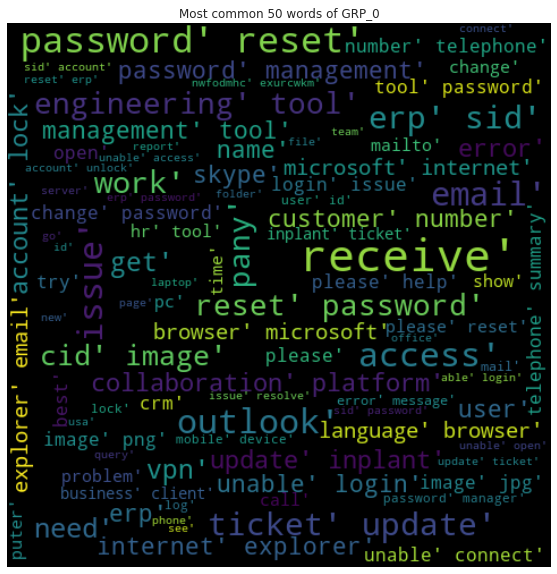

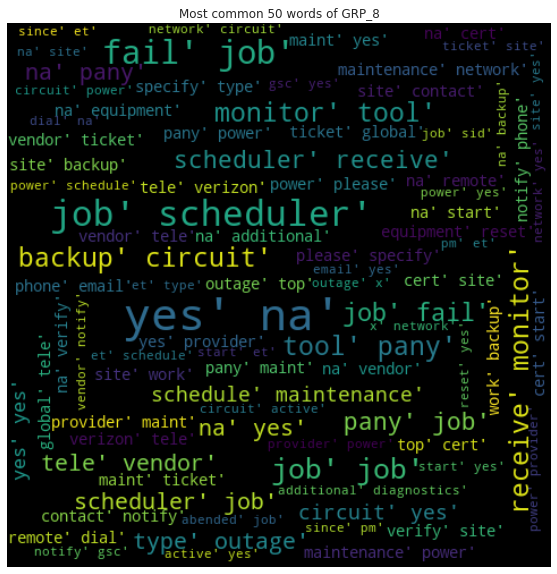

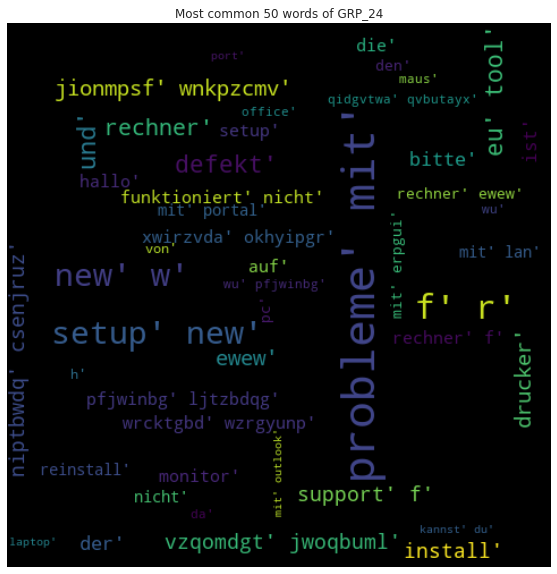

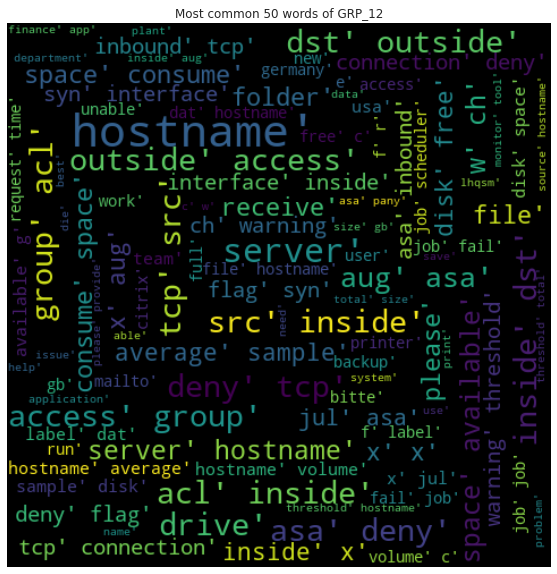

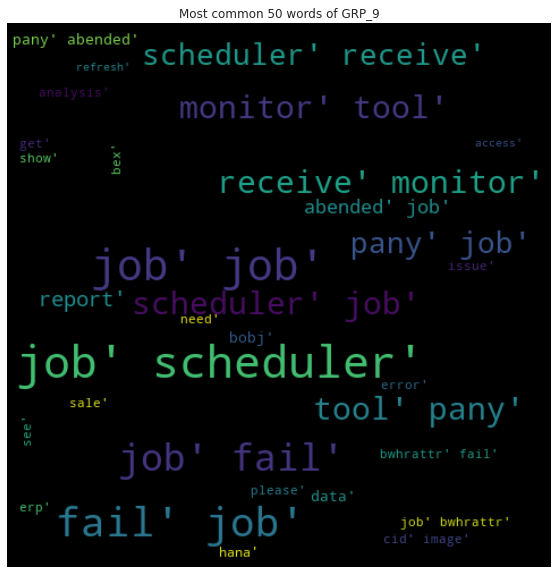

...

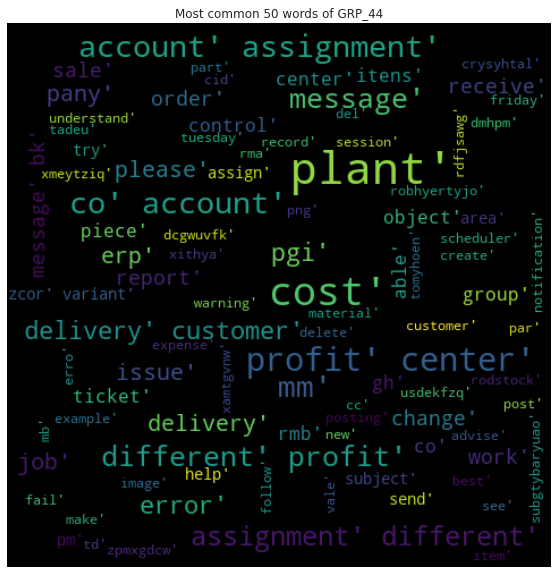

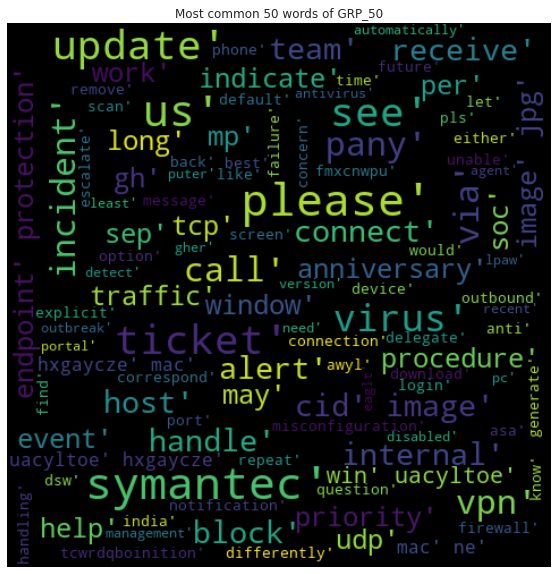

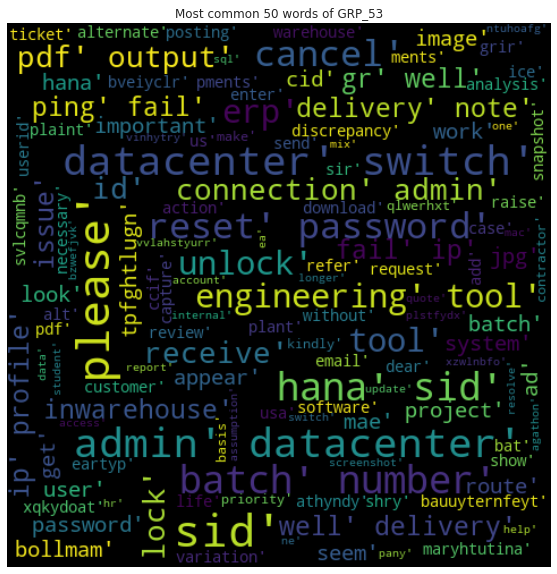

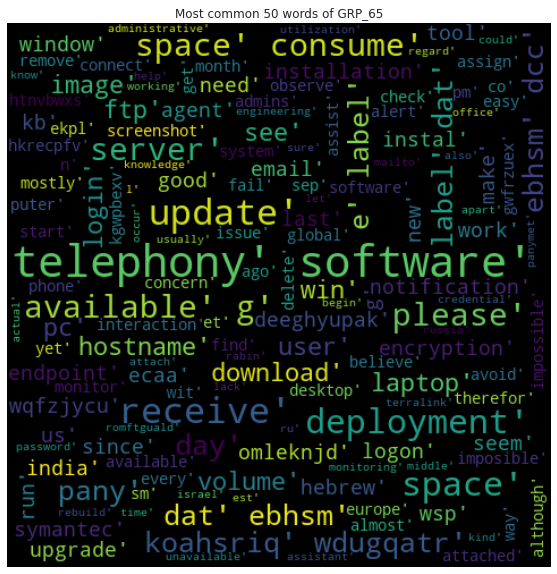

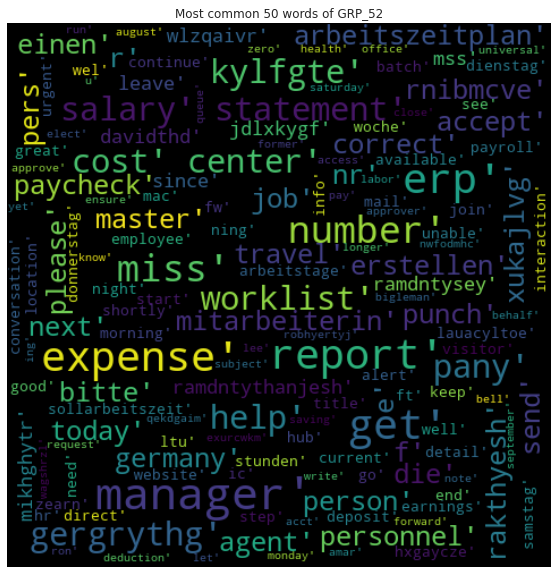

In [194]:
for i in range(50):

    Grp = df_updt[df_updt['Assignment group'] == value[i]]
    Grp = Grp['Lemmatized clean']
    wordcloud_grp(Grp,value[i])

In [195]:
max_features = 10000
maxlen = 25

In [196]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

tokenizer = Tokenizer(num_words=max_features, split=' ')
tokenizer.fit_on_texts(df_updt["New Description"].values)
X = tokenizer.texts_to_sequences(df_updt["New Description"].values)

In [197]:
sequences = tokenizer.texts_to_sequences(df_updt["New Description"].values)
X = pad_sequences(sequences, maxlen = maxlen)

print(len(X))


7909


In [198]:
tokenizer.word_index

{'to': 1,
 'the': 2,
 'in': 3,
 'job': 4,
 'from': 5,
 'is': 6,
 'no': 7,
 'not': 8,
 'on': 9,
 'pany': 10,
 'i': 11,
 'and': 12,
 'for': 13,
 'tool': 14,
 'a': 15,
 's': 16,
 'at': 17,
 'received': 18,
 'please': 19,
 't': 20,
 'yes': 21,
 'na': 22,
 'password': 23,
 'scheduler': 24,
 'erp': 25,
 'of': 26,
 'it': 27,
 'failed': 28,
 'sid': 29,
 'access': 30,
 'user': 31,
 'unable': 32,
 'issue': 33,
 'reset': 34,
 'ticket': 35,
 'my': 36,
 'with': 37,
 'you': 38,
 'have': 39,
 'error': 40,
 'hostname': 41,
 'monitoring': 42,
 'can': 43,
 'e': 44,
 'am': 45,
 'are': 46,
 'email': 47,
 'outlook': 48,
 'be': 49,
 'account': 50,
 'working': 51,
 'site': 52,
 'we': 53,
 'that': 54,
 'f': 55,
 'help': 56,
 'when': 57,
 'as': 58,
 'need': 59,
 'system': 60,
 'circuit': 61,
 'id': 62,
 'power': 63,
 'name': 64,
 'login': 65,
 'network': 66,
 'an': 67,
 'but': 68,
 'vendor': 69,
 'was': 70,
 'has': 71,
 'c': 72,
 'et': 73,
 'x': 74,
 'or': 75,
 'update': 76,
 'if': 77,
 'd': 78,
 'by': 79,
 'd